# No-Probability Burial: Animation Exports

This notebook contains only reusable animation and final-frame PNG export steps for the no-probability burial scenarios.

In [4]:
from pathlib import Path
import sys

import numpy as np
import xarray as xr
from IPython.display import Image, display

workspace_root = Path.cwd()
if not (workspace_root / 'src').exists() and workspace_root.name.lower() == 'examples':
    candidate = workspace_root.parent
    if (candidate / 'src').exists():
        workspace_root = candidate

src_path = workspace_root / 'src'
if src_path.exists() and str(src_path) not in sys.path:
    sys.path.append(str(src_path))

from sedtrails.application_interfaces.seeding_gui import SeedingGuiError, load_bathymetry_view_data
from sedtrails.pathway_visualizer.trajectories import (
    read_netcdf,
    save_trajectories_animation_with_bathymetry,
)

def load_bathymetry_xyv(config_file: Path, fallback_bathy_file: Path) -> tuple[np.ndarray, np.ndarray, np.ndarray]:
    try:
        view = load_bathymetry_view_data(config_file)
    except SeedingGuiError:
        bathy_ds = xr.open_dataset(fallback_bathy_file, engine='netcdf4', decode_times=False)
        try:
            x = np.asarray(bathy_ds['net_xcc'].values, dtype=float).reshape(-1)
            y = np.asarray(bathy_ds['net_ycc'].values, dtype=float).reshape(-1)
            v = np.asarray(bathy_ds['bedlevel'].isel(time=0).values, dtype=float).reshape(-1)
        finally:
            bathy_ds.close()
    else:
        x, y, v = view.x, view.y, view.values

    return x, y, v

def export_trajectory_products(
    ds_local,
    config_file: Path,
    fallback_bathy_file: Path,
    output_gif: Path,
    output_png: Path,
    *,
    cmap_name: str = 'SEAWAD',
    levels: int = 20,
    interval_ms: int = 150,
    gif_fps: int = 8,
    dpi: int = 140,
    display_outputs: bool = True,
):
    x, y, v = load_bathymetry_xyv(config_file, fallback_bathy_file)
    gif_path, png_path = save_trajectories_animation_with_bathymetry(
        ds_local,
        bathy_x=x,
        bathy_y=y,
        bathy_values=v,
        output_gif=output_gif,
        output_png=output_png,
        bathymetry_colormap_name=cmap_name,
        bathymetry_levels=levels,
        interval_ms=interval_ms,
        gif_fps=gif_fps,
        dpi=dpi,
    )
    print(f'Saved animation to: {gif_path}')
    print(f'Saved final timestep PNG to: {png_path}')

    if display_outputs:
        display(Image(filename=str(gif_path)))
        display(Image(filename=str(png_path)))

    return gif_path, png_path

In [ ]:
# Default no-probability burial scenario
RESULTS_FILE = workspace_root / 'examples' / 'output' / 'sedtrails_results.nc'
CONFIG_FILE = workspace_root / 'examples' / 'sedtrails-example-no-prob-burial.yaml'
BATHY_FILE = workspace_root / 'sample-data' / 'inlet_sedtrails.nc'
ANIM_GIF = workspace_root / 'examples' / 'results' / 'no_prob_burial_populations.gif'
FINAL_PNG = workspace_root / 'examples' / 'results' / 'no_prob_burial_populations_final_timestep.png'

ds = read_netcdf(RESULTS_FILE)
gif_path, png_path = export_trajectory_products(
    ds_local=ds,
    config_file=CONFIG_FILE,
    fallback_bathy_file=BATHY_FILE,
    output_gif=ANIM_GIF,
    output_png=FINAL_PNG,
    cmap_name='SEAWAD',
    levels=20,
    interval_ms=150,
    gif_fps=8,
    dpi=140,
    display_outputs=True,
)

FileNotFoundError: NetCDF file 'c:\sedtrails-sgp\results\sedtrails_results.nc' not found.

Saved animation to: c:\sedtrails-sgp\results_seeded_bnds\no_prob_burial_populations_bnds.gif
Saved final timestep PNG to: c:\sedtrails-sgp\results_seeded_bnds\no_prob_burial_populations_bnds_final_timestep.png


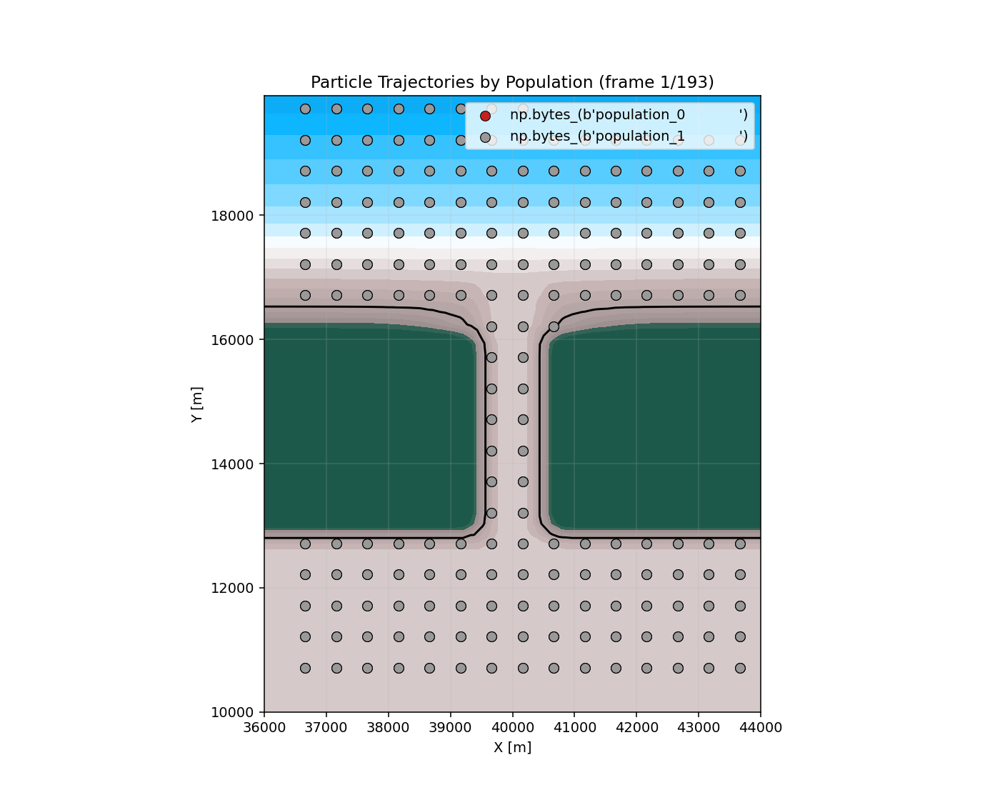

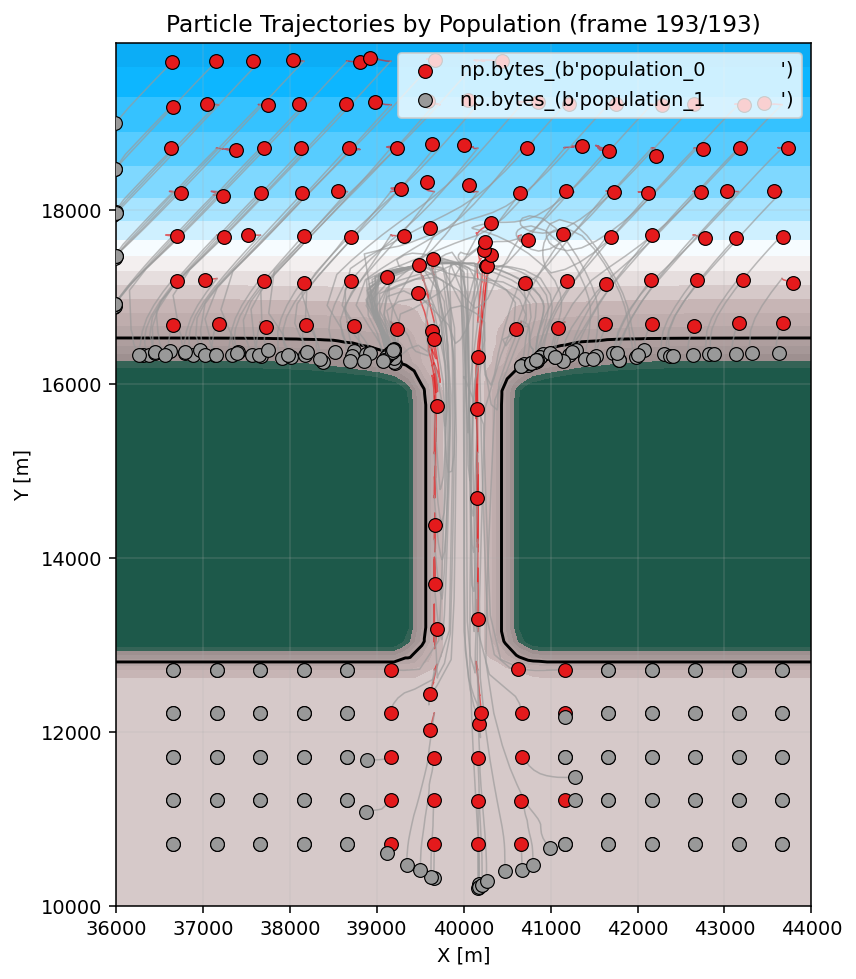

In [6]:
# Seeded + boundary-polygon scenario
RESULTS_FILE_BNDS = workspace_root / 'results_seeded_bnds' / 'sedtrails_results.nc'
CONFIG_FILE_BNDS = workspace_root / 'examples' / 'sedtrails-example-no-prob-burial-seeded-bnds.yaml'
BATHY_FILE = workspace_root / 'sample-data' / 'inlet_sedtrails.nc'
ANIM_GIF_BNDS = workspace_root / 'results_seeded_bnds' / 'no_prob_burial_populations_bnds.gif'
FINAL_PNG_BNDS = workspace_root / 'results_seeded_bnds' / 'no_prob_burial_populations_bnds_final_timestep.png'

ds_bnds = read_netcdf(RESULTS_FILE_BNDS)
gif_path_bnds, png_path_bnds = export_trajectory_products(
    ds_local=ds_bnds,
    config_file=CONFIG_FILE_BNDS,
    fallback_bathy_file=BATHY_FILE,
    output_gif=ANIM_GIF_BNDS,
    output_png=FINAL_PNG_BNDS,
    cmap_name='SEAWAD',
    levels=20,
    interval_ms=150,
    gif_fps=8,
    dpi=140,
    display_outputs=True,
)